**Brian Blaylock**  
**December 7, 2018**

# HRRR OSG for each transmission line point

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from datetime import datetime, timedelta
import xarray

import sys
sys.path.append('/uufs/chpc.utah.edu/common/home/u0553130/pyBKB_v3')
from BB_maps.my_basemap import draw_centermap
from BB_HRRR.HRRR_Pando import pluck_hrrr_point, get_hrrr_latlon, get_hrrr_variable, hrrr_subset
from BB_cmap.NWS_standard_cmap import cm_wind

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [15,9]
mpl.rcParams['figure.titlesize'] = 15
mpl.rcParams['figure.titleweight'] = 'bold'
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['axes.titlesize'] = 15
mpl.rcParams['lines.linewidth'] = 1.8
mpl.rcParams['grid.linewidth'] = .25
mpl.rcParams['figure.subplot.wspace'] = 0.01
mpl.rcParams['figure.subplot.hspace'] = 0.01
mpl.rcParams['legend.fontsize'] = 10
mpl.rcParams['legend.framealpha'] = .75
mpl.rcParams['legend.loc'] = 'best'
mpl.rcParams['savefig.bbox'] = 'tight'
mpl.rcParams['savefig.dpi'] = 100

In [3]:
location = {'CAMP': {'incident number': 'CA-BTU-016737',
                     'cause': 'Unknown',
                     'report date': datetime(2018, 11, 8),
                     'start date': datetime(2018, 11, 8),
                     'IMT Type': np.nan,
                     'state': 'California',
                     'area': np.nan,
                     'percent contained': 'Not Reported',
                     'expected containment': 'Not Reported',
                     'latitude': 39.820,
                     'longitude': -121.440,
                     'is MesoWest': False}}

In [4]:
def add_CAMP_perim(ax, m):
    per = m.readshapefile('/uufs/chpc.utah.edu/common/home/u0553130/oper/HRRR_fires/fire_shapefiles/2018_camp/ca_camp_20181125_1822_dd83', 'perim',
                          zorder=12, color='indianred', linewidth=.8)
    per = m.readshapefile('/uufs/chpc.utah.edu/common/home/u0553130/oper/HRRR_fires/fire_shapefiles/2018_camp/ca_camp_20181125_1822_dd83', 'perim', drawbounds=False)
    patches = []
    for info, shape in zip(m.perim_info, m.perim):
        # Check if the boundary is one of the large active fires
        if info['fireName'].upper() in location.keys():
            patches.append(Polygon(np.array(shape), True) )
    ax.add_collection(PatchCollection(patches, facecolor='indianred', alpha=.65, edgecolor='k', linewidths=.1, zorder=1))

## Load the Transmission Line points

In [5]:
oid = []
fid = []
lon = []
lat = []
with open('data/100km_data_tlinepts.csv') as csv:
    for b in csv.readlines()[1:]:
        b = b.split(',')
        oid.append(int(b[0]))
        fid.append(int(b[1]))
        lon.append(float(b[-10]))
        lat.append(float(b[-11]))

In [6]:
power_latlon = np.stack((lat, lon)).T

In [7]:
np.shape(power_latlon)

(6906, 2)

## Load the HRRR data

In [8]:
hLATLON = get_hrrr_latlon()
hLAT = hLATLON['lat']
hLON = hLATLON['lon']

/uufs/chpc.utah.edu/common/home/u0553130/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [9]:
#plucks = np.array([pluck_hrrr_point(hLATLON,  lat=m, lon=n, XY_only=True, verbose=False) for m, n in power_latlon])
#np.save('./data/HRRR_xy_points_for_powergrid', plucks)

plucks = np.load('./data/HRRR_xy_points_for_powergrid.npy')

In [10]:
np.shape(plucks)

(6906, 2)

## Find unique HRRR grid points

In [11]:
unique_XYs = np.unique(plucks, axis=0)
np.shape(unique_XYs)

(492, 2)

## Power points with unique HRRR grid points

In [13]:
ulon = np.array([hLATLON['lon'][m, n] for m, n in unique_XYs])
ulat = np.array([hLATLON['lat'][m, n] for m, n in unique_XYs])

## Draw maps

In [12]:
m = draw_centermap(location['CAMP']['latitude'], location['CAMP']['longitude'], size=(1,1))

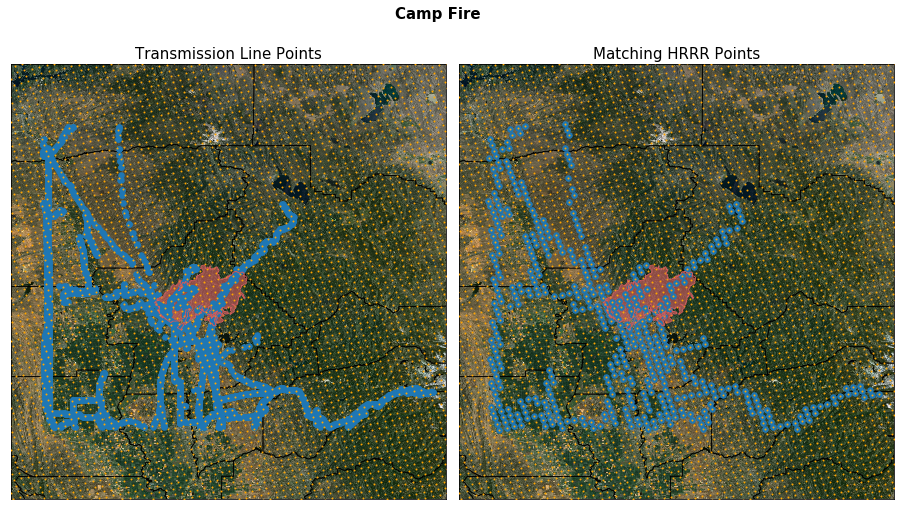

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=[16, 8])

plt.suptitle('Camp Fire')

plt.sca(ax1)
plt.title('Transmission Line Points')
add_CAMP_perim(ax1, m)
m.scatter(lon, lat, latlon=True, s=30, zorder=10)
m.scatter(hLON, hLAT, latlon=True, zorder=11, c='orange', s=1)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 

plt.sca(ax2)
plt.title('Matching HRRR Points')
add_CAMP_perim(ax2, m)
m.scatter(ulon, ulat, latlon=True, s=30, zorder=10)
m.scatter(hLON, hLAT, latlon=True, zorder=11, c='orange', s=1)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 


plt.savefig('hrrr_grid_points')

---

## Load OSG Data

In [18]:
DATE = datetime(2016, 11, 8, 15)
variable = 'GUST:surface'
var = variable.replace(':', '_').replace(' ', '_')
DIR = '/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/%s/' % var
FILE = 'OSG_HRRR_%s_m%02d_d%02d_h%02d_f00.h5' % (var, DATE.month, DATE.day, DATE.hour)
print(DIR+FILE)

/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h15_f00.h5


In [19]:
OSG = xarray.open_dataset(DIR+FILE)

In [20]:
OSG_50th = np.array([OSG['p50'].data[m,n] for m, n in unique_XYs])
OSG_75th = np.array([OSG['p75'].data[m,n] for m, n in unique_XYs])
OSG_95th = np.array([OSG['p95'].data[m,n] for m, n in unique_XYs])
OSG_99th = np.array([OSG['p99'].data[m,n] for m, n in unique_XYs])

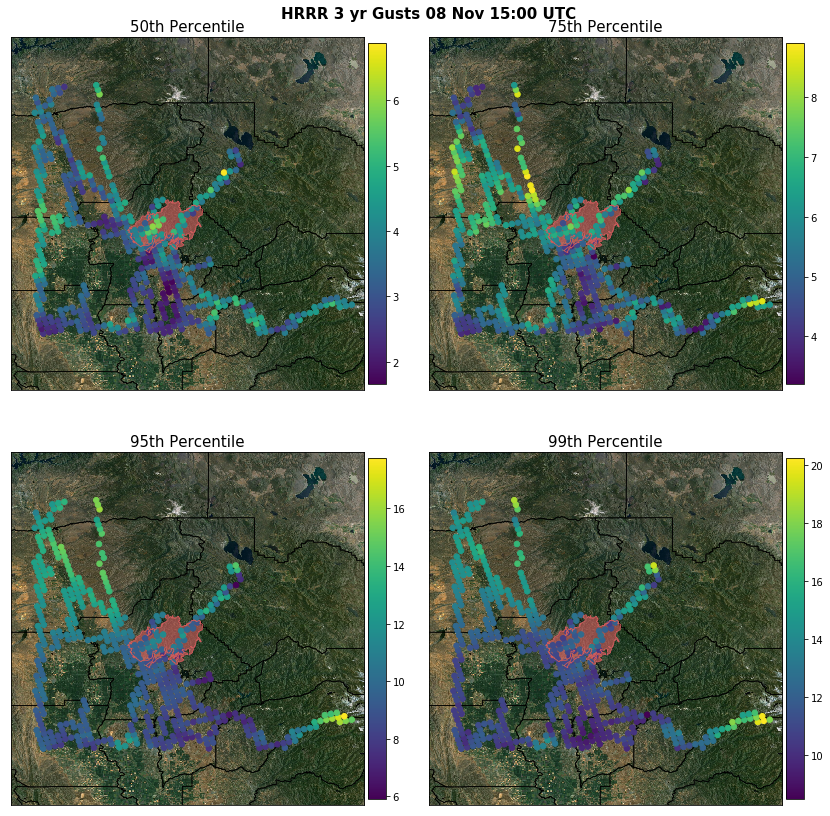

In [21]:
fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(2, 2, figsize=[12, 12])

plt.suptitle('HRRR 3 yr Gusts %s' % DATE.strftime('%d %b %H:%M UTC'))

plt.sca(ax1)
add_CAMP_perim(plt.gca(), m)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 
plt.title('50th Percentile')
m.scatter(ulon, ulat, latlon=True, s=30, c=OSG_50th,
          zorder=10)
plt.colorbar(pad=.01, shrink=.8)

plt.sca(ax2)
add_CAMP_perim(plt.gca(), m)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 
plt.title('75th Percentile')
m.scatter(ulon, ulat, latlon=True, s=30, c=OSG_75th,
          zorder=10)
plt.colorbar(pad=.01, shrink=.8)

plt.sca(ax3)
add_CAMP_perim(plt.gca(), m)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 
plt.title('95th Percentile')
m.scatter(ulon, ulat, latlon=True, s=30, c=OSG_95th,
          zorder=10)
plt.colorbar(pad=.01, shrink=.8)

plt.sca(ax4)
add_CAMP_perim(plt.gca(), m)
m.drawcounties(linewidth=.7)
m.arcgisimage(xpixels=1000) 
plt.title('99th Percentile')
m.scatter(ulon, ulat, latlon=True, s=30, c=OSG_99th,
          zorder=10)
plt.colorbar(pad=.01, shrink=.8)


plt.tight_layout()
plt.savefig('percentiles')

---

# Forecast

In [15]:
color = cm_wind()
cmap = color['cmap']
vmin = color['vmin']
vmax = color['vmax']

working on f00
working on f01
working on f02
working on f03
working on f04
working on f05
working on f06
working on f07
working on f08
working on f09
working on f10
working on f11
working on f12
working on f13
working on f14
working on f15
working on f16
working on f17
working on f18


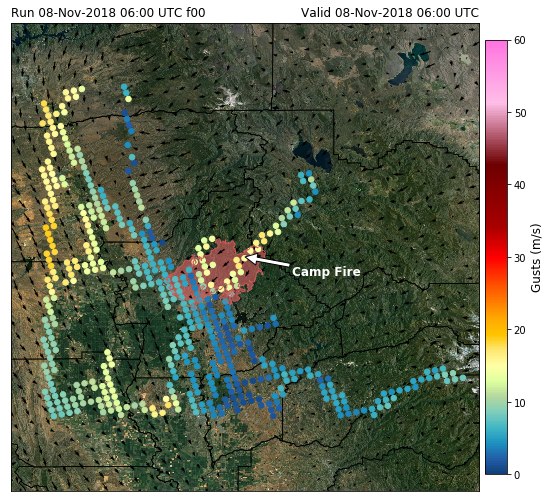

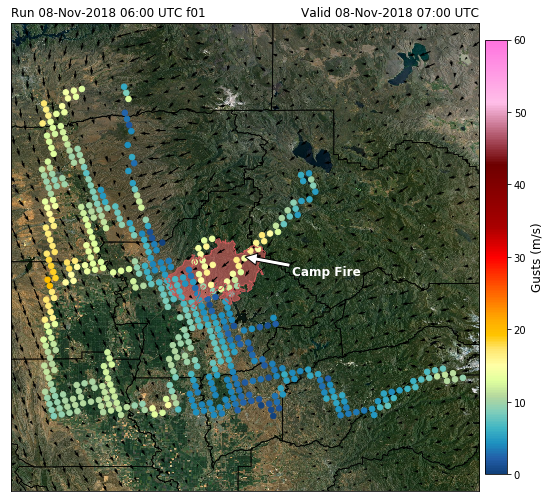

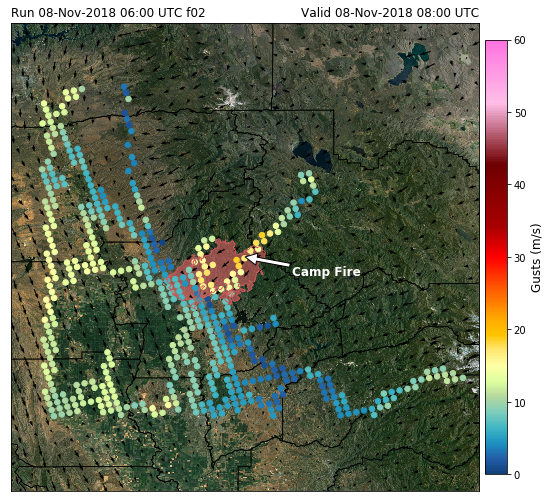

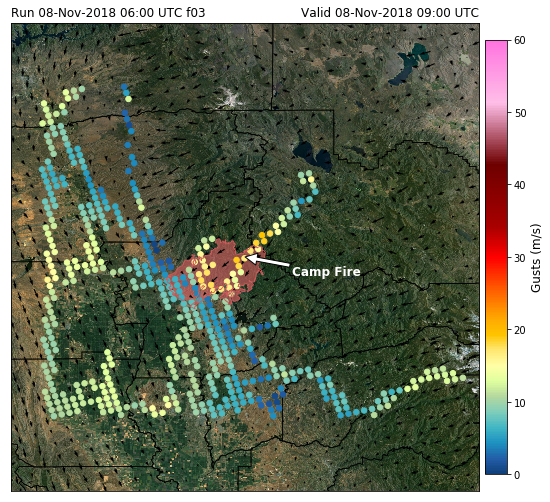

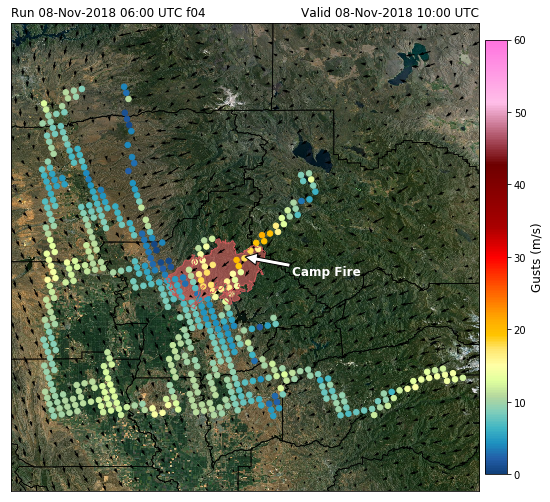

...

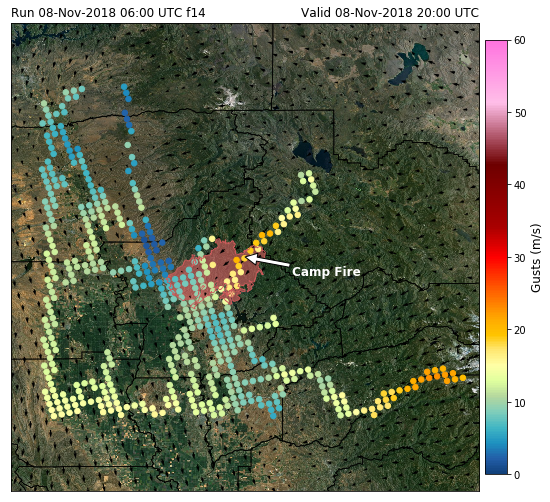

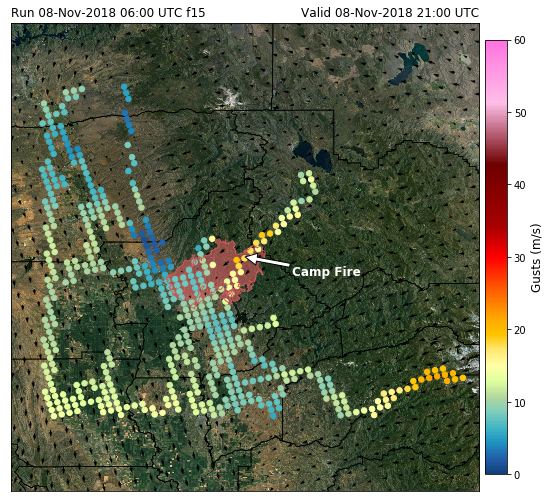

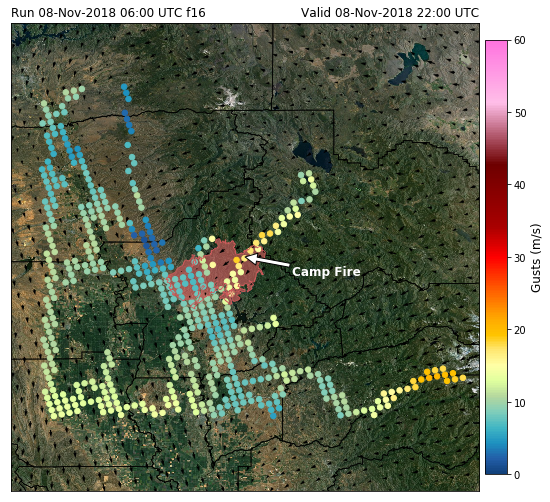

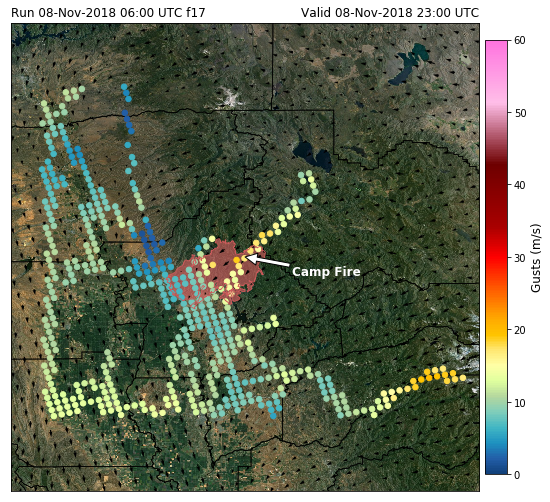

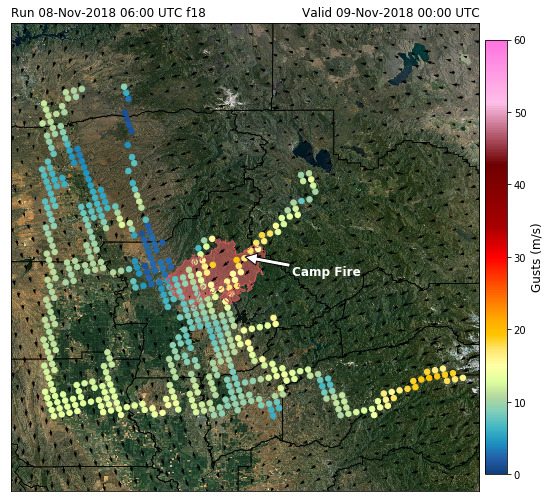

In [17]:
runDATE = datetime(2018, 11, 8, 6)
for f in range(19):
    print('working on f%02d' % f)
    H = get_hrrr_variable(runDATE, variable='GUST:surface', fxx=f, verbose=False)
    
    Huv = get_hrrr_variable(runDATE, variable='UVGRD:10 m', fxx=f, verbose=False)
    Huv = hrrr_subset(Huv, half_box=50, 
                      lat=location['CAMP']['latitude'],
                      lon=location['CAMP']['longitude'], verbose=False)
    
    vv = np.array([H['value'][m, n] for m, n in unique_XYs])
    
    plt.figure(figsize=[10,10])
    plt.title('Run %s f%02d'% (H['anlys'].strftime('%d-%b-%Y %H:%M UTC'), f), loc='left', fontsize=12)
    plt.title('Valid %s' % H['valid'].strftime('%d-%b-%Y %H:%M UTC'), loc='right', fontsize=12)
    
    add_CAMP_perim(plt.gca(), m)
    m.drawcounties(linewidth=.7)
    #m.arcgisimage(service='World_Shaded_Relief', xpixels=1000) 
    m.arcgisimage(xpixels=1000)
    
    m.scatter(ulon, ulat, latlon=True, s=30, c=vv,
              cmap=cmap, vmin=vmin, vmax=vmax,
              zorder=10)
    
    plt.colorbar(pad=.01, shrink=.8, label='Gusts (%s)' % color['units'])
    
    thin = 2
    m.quiver(Huv['lon'][::thin,::thin], Huv['lat'][::thin,::thin],
             Huv['UGRD'][::thin,::thin], Huv['VGRD'][::thin,::thin], 
             latlon=True,
             #length=4,
             #barb_increments=dict(half=2.5, full=10, flag=25)
             )
    
    plt.annotate('Camp Fire', (location['CAMP']['longitude'], location['CAMP']['latitude']),
                 xytext=(location['CAMP']['longitude']+.2, location['CAMP']['latitude']-.08),
                 arrowprops={'width':4,
                             'facecolor':'white',
                             'edgecolor':'black'},
                 color='white', fontsize=12, weight='semibold',
                 zorder=100)
    plt.savefig('%s_f%02d' % (H['anlys'].strftime('%Y%m%d_%H%M'), f))

working on f17
/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h23_f00.h5
working on f18
/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d09_h00_f00.h5


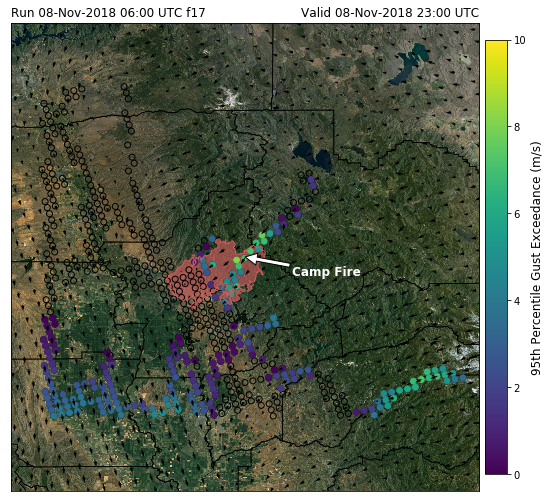

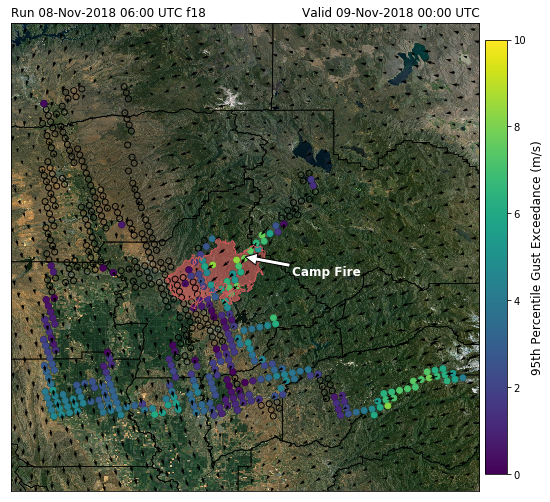

In [16]:
runDATE = datetime(2018, 11, 8, 6)
for f in range(19)[17:]:
    print('working on f%02d' % f)
    H = get_hrrr_variable(runDATE, variable='GUST:surface', fxx=f, verbose=False)
    Huv = get_hrrr_variable(runDATE, variable='UVGRD:10 m', fxx=f, verbose=False)
    Huv = hrrr_subset(Huv, half_box=50, 
                      lat=location['CAMP']['latitude'],
                      lon=location['CAMP']['longitude'], verbose=False)    
    
    DATE = datetime(2016, H['valid'].month, H['valid'].day, H['valid'].hour)
    variable = 'GUST:surface'
    var = variable.replace(':', '_').replace(' ', '_')
    DIR = '/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/%s/' % var
    FILE = 'OSG_HRRR_%s_m%02d_d%02d_h%02d_f00.h5' % (var, DATE.month, DATE.day, DATE.hour)
    print(DIR+FILE)
    OSG = xarray.open_dataset(DIR+FILE)
    OSG_95th = np.array([OSG['p95'].data[m,n] for m, n in unique_XYs])
    
    
    vv = np.array([H['value'][m, n] for m, n in unique_XYs])
    
    # What forecasted winds are larger than the OSG winds?
    gt95 = vv-OSG_95th
    condition = gt95>0
    
    plt.figure(figsize=[10,10])
    plt.title('Run %s f%02d'% (H['anlys'].strftime('%d-%b-%Y %H:%M UTC'), f), loc='left', fontsize=12)
    plt.title('Valid %s' % H['valid'].strftime('%d-%b-%Y %H:%M UTC'), loc='right', fontsize=12)
    
    add_CAMP_perim(plt.gca(), m)
    m.drawcounties(linewidth=.7)
    #m.arcgisimage(service='World_Shaded_Relief', xpixels=1000) 
    m.arcgisimage(xpixels=1000)
    
        
    m.scatter(ulon, ulat, facecolor='none', edgecolor='k')
    m.scatter(ulon[condition], ulat[condition], c=gt95[condition], vmax=10, vmin=0)    
    plt.colorbar(pad=.01, shrink=.8, label='95th Percentile Gust Exceedance (%s)' % color['units'])
    
    thin = 2
    m.quiver(Huv['lon'][::thin,::thin], Huv['lat'][::thin,::thin],
             Huv['UGRD'][::thin,::thin], Huv['VGRD'][::thin,::thin], 
             latlon=True,
             #length=4,
             #barb_increments=dict(half=2.5, full=10, flag=25)
             )
    
    plt.annotate('Camp Fire', (location['CAMP']['longitude'], location['CAMP']['latitude']),
                 xytext=(location['CAMP']['longitude']+.2, location['CAMP']['latitude']-.08),
                 arrowprops={'width':4,
                             'facecolor':'white',
                             'edgecolor':'black'},
                 color='white', fontsize=12, weight='semibold',
                 zorder=100)
    plt.savefig('OSG_95th_%s_f%02d' % (H['anlys'].strftime('%Y%m%d_%H%M'), f))

## Save a .csv file of the data

A file for the forecast data

In [97]:
def forecast_data(runDATE, XY_point_pairs, variable='GUST:surface', fxx=range(19), outdir='./'):
    '''
    Return a csv of forecasted values for a series of points
    
    Input:
        runDATE        - Python Datetime Object for the model run date interested in
        XY_point_pairs - XY array coordinates for the points you want 
        variable       - HRRR variable name
        fxx            - Forecasts to include in the output
        outdir         - Path to write file
    '''
    ## First, get the latitude and longitude grid points that coorespond to the XY points
        
    # Load the HRRR latitude and longitude grid
    hLATLON = get_hrrr_latlon()
    
    # Get the latitude and longitude values for each XY point pair
    ulon = np.array([hLATLON['lon'][m, n] for m, n in XY_point_pairs])
    ulat = np.array([hLATLON['lat'][m, n] for m, n in XY_point_pairs])
    
    # We want to return these (and keep track of the header) 
    header = 'LATITUDE, LONGITUDE'
    return_this = np.array([ulat, ulon])
    
    ## Next, get the forecasts for each of the points
    for f in fxx:
        print('\rworking on f%02d' % f, end="")
        # Get the HRRR File
        H = get_hrrr_variable(runDATE, variable='GUST:surface', fxx=f, verbose=False)    
        
        # Get the points from the grid for the transmision lines
        vv = np.array([H['value'][m, n] for m, n in unique_XYs])
        
        # Add that to the array we want to return
        return_this = np.vstack([return_this, vv])
        header+=',F%02d' % f
        
    print('\rDONE!')
    
    ## Save the file 
    np.savetxt('HRRR_%s_run_%s.csv' % (variable.split(':')[0], runDATE.strftime('%Y%m%d-%H%M')), np.rot90(return_this), 
               fmt='%.5f', header=header, delimiter=',', comments='')

In [98]:
def osg_data(runDATE, XY_point_pairs, variable='GUST:surface', fxx=range(19), percentile=95, outdir='./'):
    '''
    Return a csv of HRRR climatology from OSG statistics for a series of points
    
    Input:
        runDATE        - Python Datetime Object for the model run date interested in
        XY_point_pairs - XY array coordinates for the points you want 
        variable       - HRRR variable name
        fxx            - Forecasts to include in the output
        percentile     - The percentile (from the file) you want to get
        outdir         - Path to write file
    '''
    ## First, get the latitude and longitude grid points that coorespond to the XY points
        
    # Load the HRRR latitude and longitude grid
    hLATLON = get_hrrr_latlon()
    
    # Get the latitude and longitude values for each XY point pair
    ulon = np.array([hLATLON['lon'][m, n] for m, n in XY_point_pairs])
    ulat = np.array([hLATLON['lat'][m, n] for m, n in XY_point_pairs])
    
    # We want to return these (and keep track of the header) 
    header = 'LATITUDE, LONGITUDE'
    return_this = np.array([ulat, ulon])
    
    ## Next, get the forecasts for each of the points
    for f in fxx:
        print('\rworking on f%02d' % f, end="")
        # Get the HRRR File
        validDATE = runDATE + timedelta(hours=f)
        DATE = datetime(2016, validDATE.month, validDATE.day, validDATE.hour)
        var = variable.replace(':', '_').replace(' ', '_')
        DIR = '/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/%s/' % var
        FILE = 'OSG_HRRR_%s_m%02d_d%02d_h%02d_f00.h5' % (var, DATE.month, DATE.day, DATE.hour)
        print(DIR+FILE)
        OSG = xarray.open_dataset(DIR+FILE)
        
        # Get the points from the grid for the transmision lines
        OSG_pth = np.array([OSG['p%02d' % percentile].data[m,n] for m, n in unique_XYs])
        
        # Add that to the array we want to return
        return_this = np.vstack([return_this, OSG_pth])
        header+=',F%02d' % f
        
    print('\rDONE!')
    
    ## Save the file 
    np.savetxt('HRRR_%s_OSG_p%02d_%s.csv' % (variable.split(':')[0], percentile, runDATE.strftime('%Y%m%d-%H%M')), np.rot90(return_this), 
               fmt='%.5f', header=header, delimiter=',', comments='')

In [99]:
forecast_data(runDATE, unique_XYs)

DONE!


In [100]:
osg_data(runDATE, unique_XYs)

working on f00/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h06_f00.h5
working on f01/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h07_f00.h5
working on f02/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h08_f00.h5
working on f03/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h09_f00.h5
working on f04/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h10_f00.h5
working on f05/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h11_f00.h5
working on f06/uufs/chpc.utah.edu/common/home/horel-group8/blaylock/HRRR_OSG/hourly30/GUST_surface/OSG_HRRR_GUST_surface_m11_d08_h12_f00.h5
working on f07/uufs/

In [103]:
a = np.genfromtxt('HRRR_GUST_run_20181108-0600.csv', delimiter=',', names=True)
b = np.genfromtxt('HRRR_GUST_OSG_p95_20181108-0600.csv', delimiter=',', names=True)

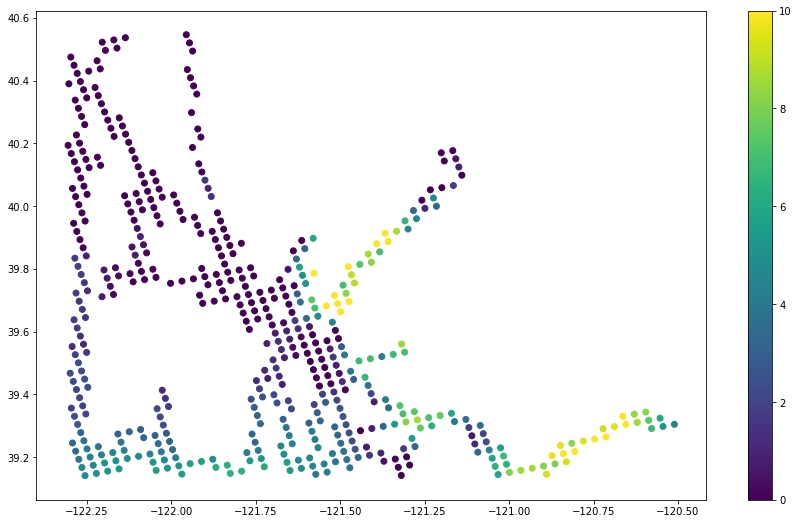

In [107]:
plt.scatter(a['LONGITUDE'], a['LATITUDE'], c=a['F12']-b['F12'], vmax=10, vmin=0)
plt.colorbar()